<a href="https://colab.research.google.com/github/sinha96/kaggel_dataset_analysis/blob/master/Credit_Card_Fraud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import os
import sys
import numpy as np 
import pandas as pd
from matplotlib import pyplot as plt
from scipy import stats
import seaborn as sns


In [0]:
#!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [35]:
link = 'https://drive.google.com/open?id=1TaKToBOox1vC7mS2aC8Ex2JmOivBmfwr'
fluff, id = link.split('=')
print (id) 
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('creditcard.csv')  
data = pd.read_csv('creditcard.csv')

1TaKToBOox1vC7mS2aC8Ex2JmOivBmfwr


In [36]:
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


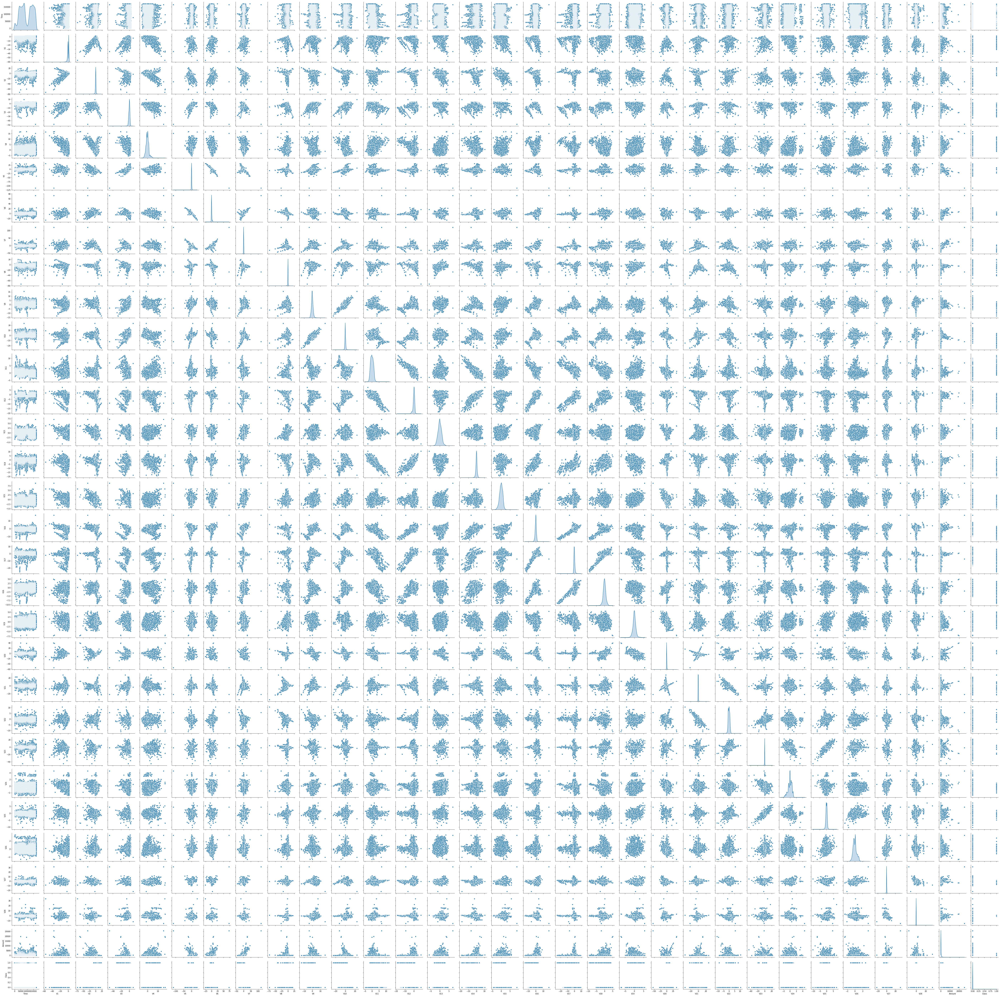

In [37]:
#distribution of dataset
sns.pairplot(data,diag_kind='kde');

In [0]:
X = data.drop('Class',axis=1)
y = data.Class

In [39]:
X.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99


In [40]:
#checking for need of scaling
X.max()

Time      172792.000000
V1             2.454930
V2            22.057729
V3             9.382558
V4            16.875344
V5            34.801666
V6            73.301626
V7           120.589494
V8            20.007208
V9            15.594995
V10           23.745136
V11           12.018913
V12            7.848392
V13            7.126883
V14           10.526766
V15            8.877742
V16           17.315112
V17            9.253526
V18            5.041069
V19            5.591971
V20           39.420904
V21           27.202839
V22           10.503090
V23           22.528412
V24            4.584549
V25            7.519589
V26            3.517346
V27           31.612198
V28           33.847808
Amount     25691.160000
dtype: float64

In [41]:
X.min()

Time        0.000000
V1        -56.407510
V2        -72.715728
V3        -48.325589
V4         -5.683171
V5       -113.743307
V6        -26.160506
V7        -43.557242
V8        -73.216718
V9        -13.434066
V10       -24.588262
V11        -4.797473
V12       -18.683715
V13        -5.791881
V14       -19.214325
V15        -4.498945
V16       -14.129855
V17       -25.162799
V18        -9.498746
V19        -7.213527
V20       -54.497720
V21       -34.830382
V22       -10.933144
V23       -44.807735
V24        -2.836627
V25       -10.295397
V26        -2.604551
V27       -22.565679
V28       -15.430084
Amount      0.000000
dtype: float64

In [0]:
#data scaling and dimension reduction
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [0]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
sc = StandardScaler()
x_train_sc = sc.fit_transform(x_train)
x_test_sc = sc.transform(x_test)
pca = PCA(n_components=5)
x_train_pca = pca.fit_transform(x_train_sc)
x_test_pca = pca.transform(x_test_sc)

In [44]:
pca.components_

array([[-2.05395543e-02, -1.81218872e-01, -3.78895371e-01,
        -1.58502947e-01,  7.83632252e-02, -2.93366941e-01,
         1.72879868e-01,  3.11815490e-01, -7.45004802e-02,
        -2.66665604e-02, -8.13156952e-02,  9.39899768e-03,
        -6.25399346e-03,  6.48490906e-03,  2.21481211e-02,
         1.30308450e-02,  1.29058175e-02,  9.36940017e-03,
         2.88515300e-02, -4.29918870e-02,  2.34639498e-01,
         6.51937281e-02, -5.82840794e-02, -9.72573662e-02,
         6.08725894e-03, -3.88503308e-02,  4.40078577e-03,
         4.08713098e-02, -1.88021336e-02,  6.97381802e-01],
       [ 7.04865529e-01,  1.09671532e-01, -6.21520801e-02,
        -4.41480225e-01, -1.09359696e-01,  1.87482511e-01,
        -7.21013305e-02,  6.75566037e-02, -4.48626946e-02,
        -1.40540349e-02,  3.89272415e-02, -2.56783701e-01,
         1.44961819e-01, -6.22473023e-02, -1.09529818e-01,
        -1.47104409e-01,  1.81689158e-02, -6.33991540e-02,
         8.01785043e-02,  1.55728674e-02, -3.30057172e-

In [45]:
pca.explained_variance_ratio_

array([0.06680754, 0.05572647, 0.03407457, 0.03378915, 0.03357611])

In [46]:
pca.explained_variance_

array([2.00423628, 1.67180262, 1.02224232, 1.01367967, 1.00728847])

In [47]:
pca.n_features_

30

In [48]:
pca.score

<bound method PCA.score of PCA(copy=True, iterated_power='auto', n_components=5, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)>

In [0]:
train = pd.concat([x_train,y_train],axis=1)

In [50]:
#total number of data present in each class in training data
train.groupby('Class').count()['V1']

Class
0    199008
1       356
Name: V1, dtype: int64

In [51]:
#total number of data present in eachclass in testing data
test = pd.concat([x_test,y_test],axis=1)
test.groupby('Class').count()['V1']

Class
0    85307
1      136
Name: V1, dtype: int64

In [52]:
#total number of data present in each class
data.groupby('Class').count()['V1']

Class
0    284315
1       492
Name: V1, dtype: int64

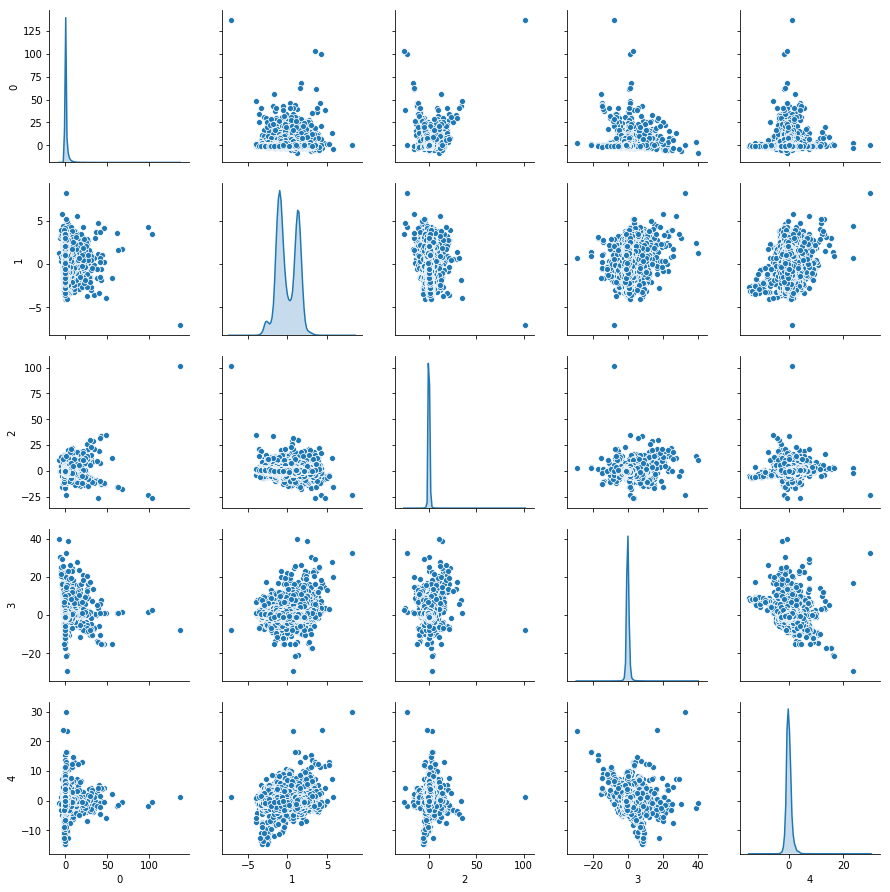

In [53]:
#principal components plots
sns.pairplot(pd.DataFrame(x_train_pca),diag_kind=('kde'));

In [54]:
#Modelling
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier()
clf.fit(x_train_sc,y_train)
y_pred = clf.predict(x_test_sc)
print(clf.score(x_train_sc,y_train))
print(clf.score(x_test_sc,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


0.9999297766898738
0.9995435553526912


In [0]:
#cross validation using grid seach cv
from sklearn.model_selection import GridSearchCV
param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}
rfc = RandomForestClassifier(random_state=42)
CV_rfc = GridSearchCV(estimator=clf, param_grid=param_grid, cv= 5)
CV_rfc.fit(x_train, y_train)
CV_rfc.best_params_

In [0]:
#for predicting real time data
real_time_data = []
for i in data.columns[:-1]:
  real_time_data.append(float(input(f'please enter {i}')))
real_time_data = np.array(real_time_data).reshape(-1,1)
real_time_data_sc = sc.fit(real_time_data)
Class = clf.predict(real_time_data_sc)
if Class==0:
  print('the transaction is healthy')
else:
  print('The transtion is fishy')